In [29]:
import pandas as pd
import numpy as np
import h5py
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import savgol_filter

file_name = "data/210413_BNP_transect/BNP_data_collection_210413.h5"
h5_file = h5py.File(file_name, "r")

In [2]:
ses1 = 'session001/cal001'
inserts = list(h5_file[f'{ses1}'].keys())
inserts

['ins001',
 'ins002',
 'ins003',
 'ins004',
 'ins005',
 'ins006',
 'ins007',
 'ins008',
 'ins009',
 'ins010',
 'ins011',
 'ins012',
 'ins013',
 'ins014',
 'ins015',
 'ins016',
 'ins017',
 'ins018',
 'ins019',
 'ins020',
 'ins021',
 'ins022']

In [3]:
vis_waves = h5_file[ses1].attrs['spec1_wavelengths_vector'][:]
ftir_waves = h5_file[ses1].attrs['spec2_wavelengths_vector'][:]

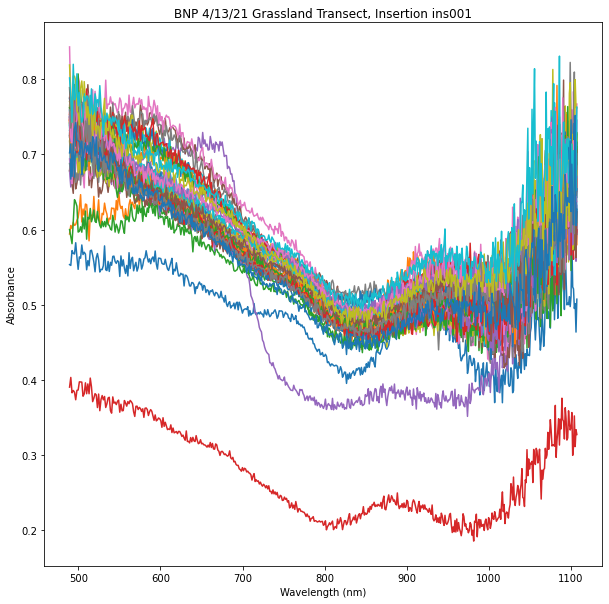

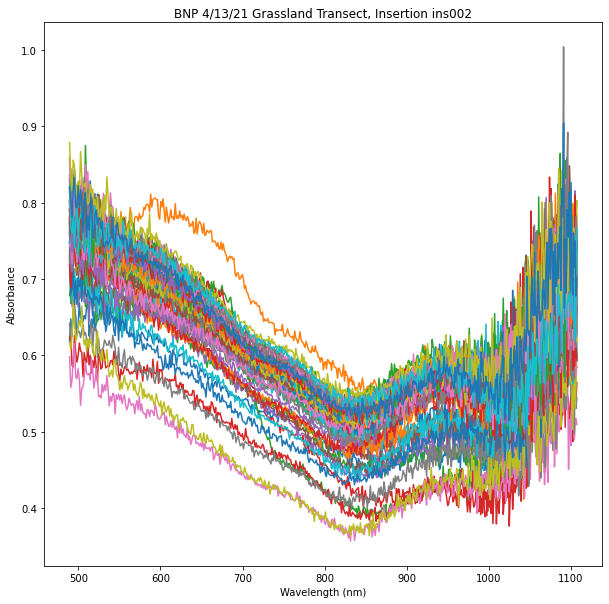

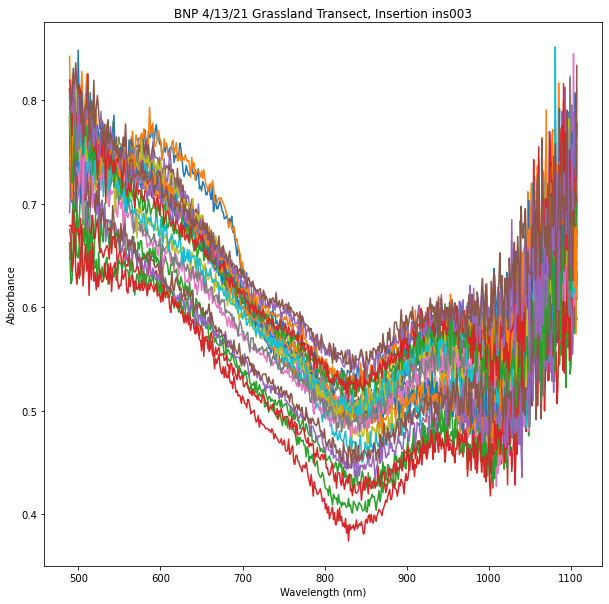

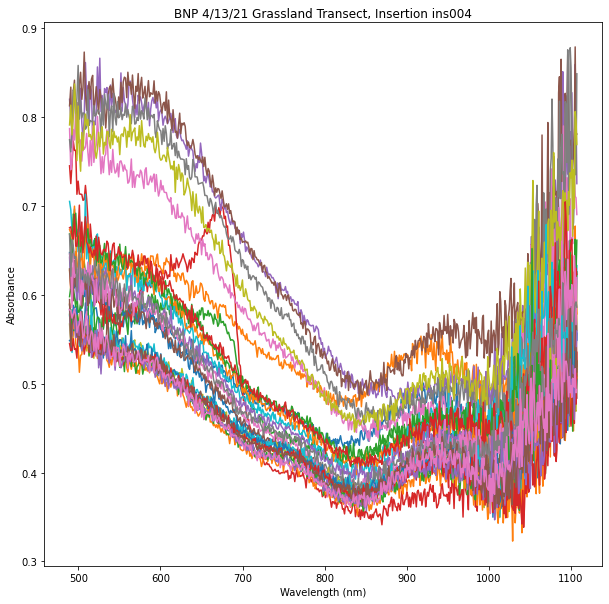

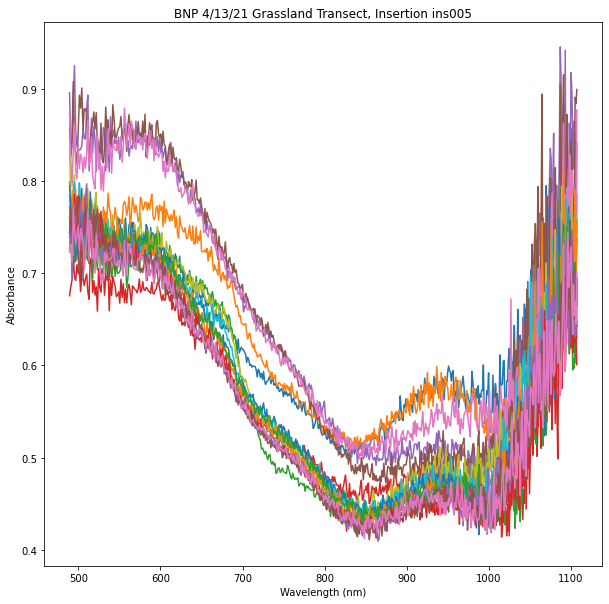

...

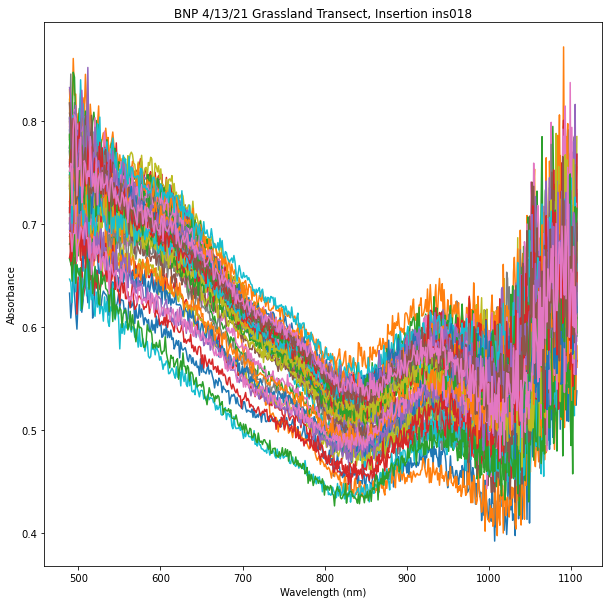

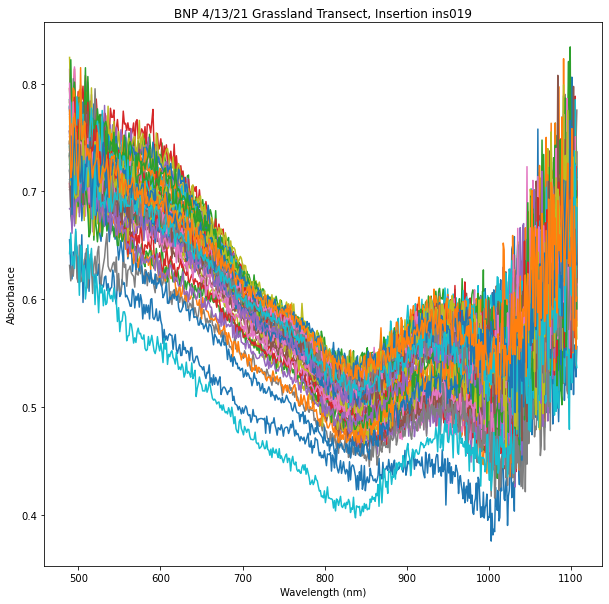

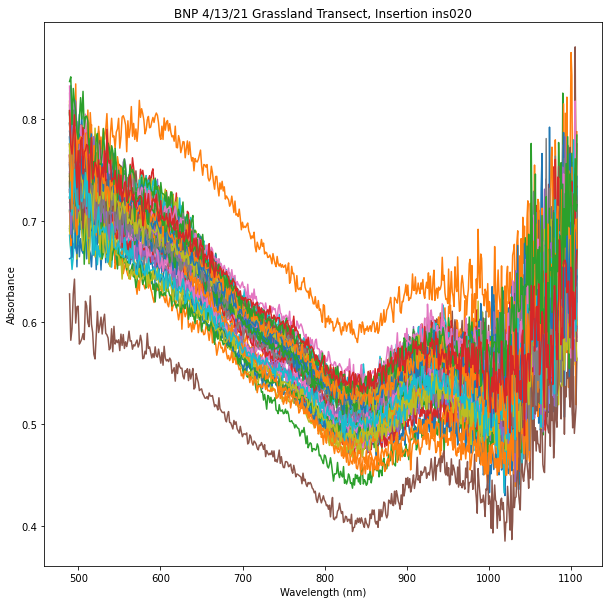

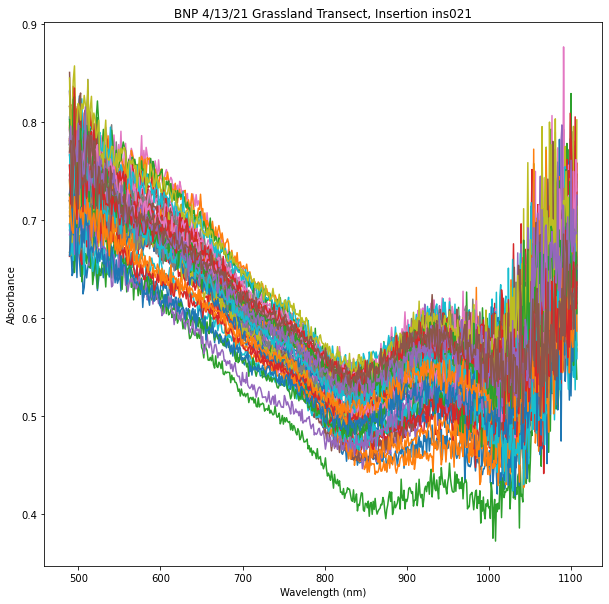

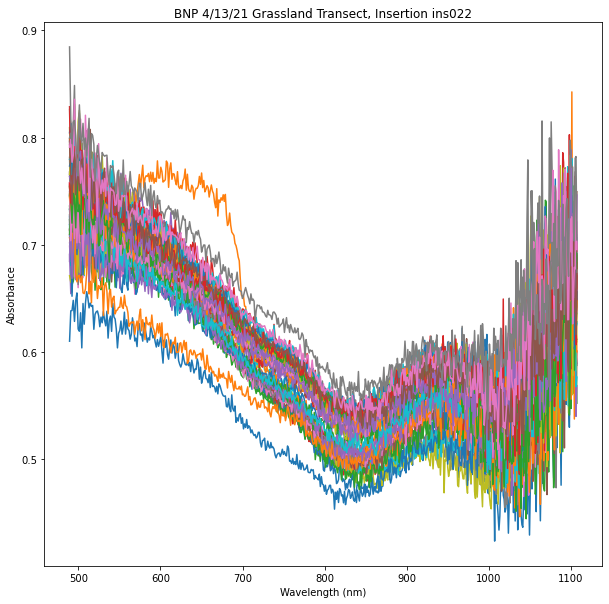

In [5]:
for insert in inserts:
    ins_abs = h5_file[f'{ses1}/{insert}/spectrometer1/derived/absorbances'][:]
    fix, ax = plt.subplots(figsize=(10,10))
    ax.set_title(f"BNP 4/13/21 Grassland Transect, Insertion {insert}")
    ax.set_ylabel("Absorbance")
    ax.set_xlabel("Wavelength (nm)")
    for i in range (ins_abs.shape[0]):
        ax.plot(vis_waves, ins_abs[i, :])
    plt.show()

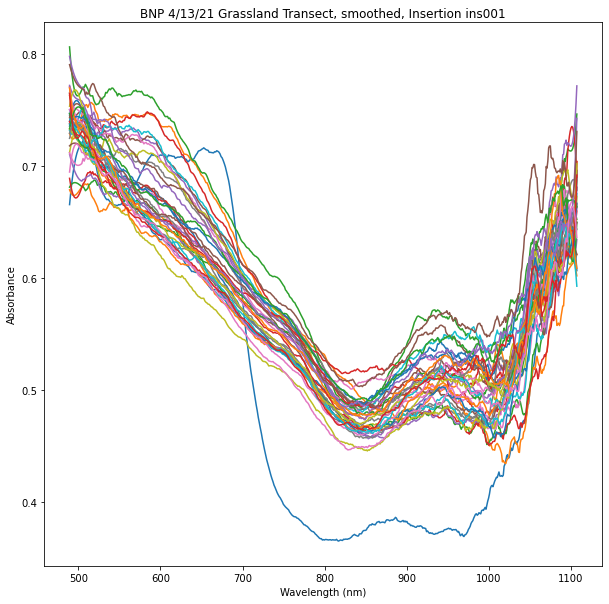

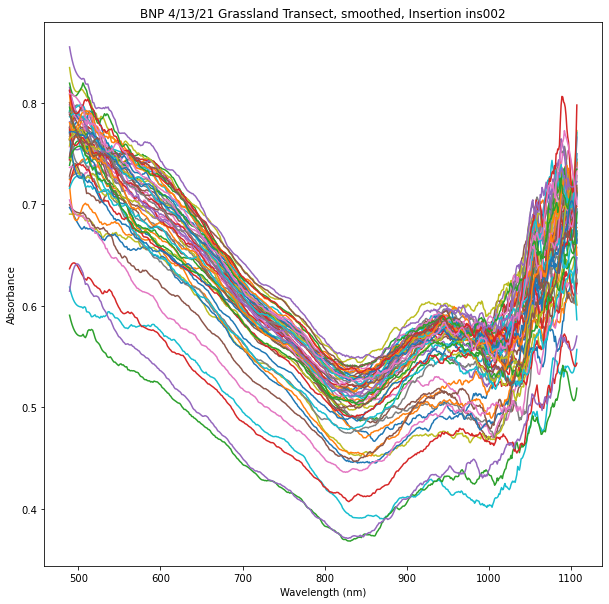

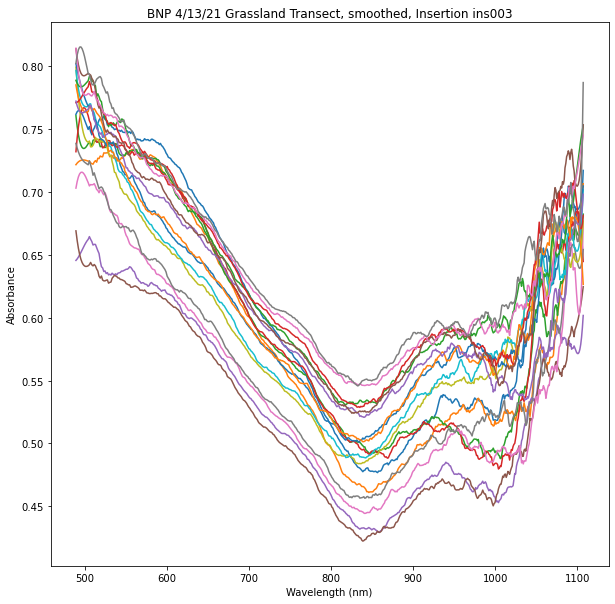

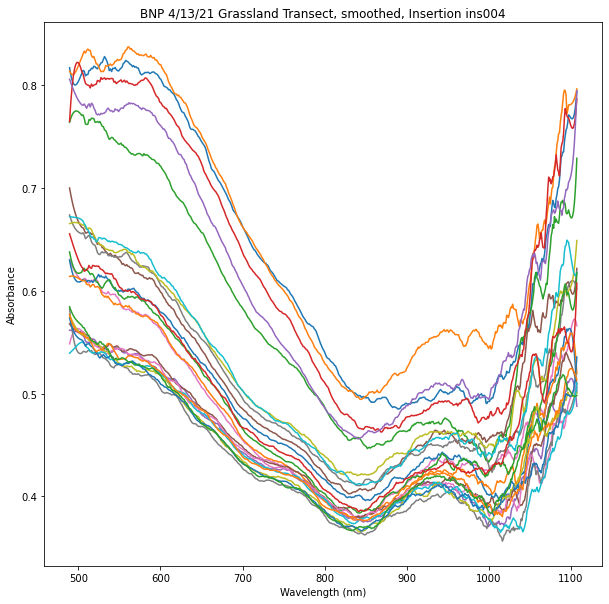

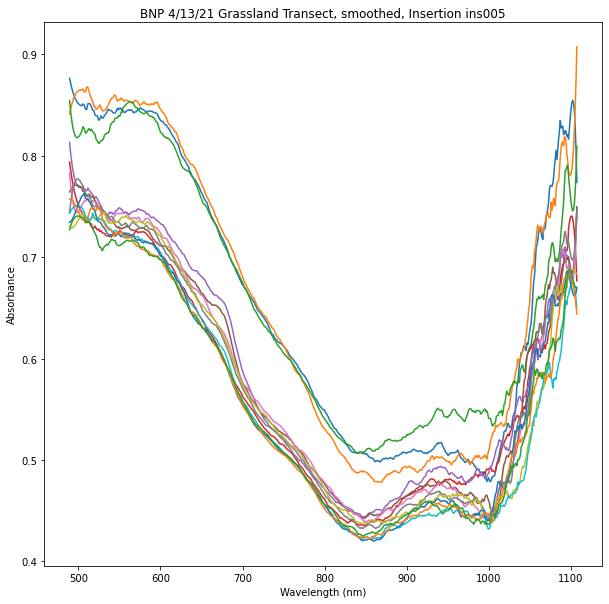

...

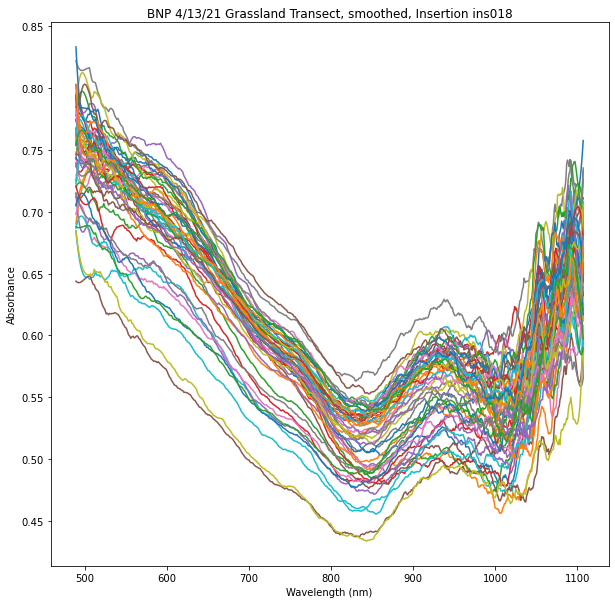

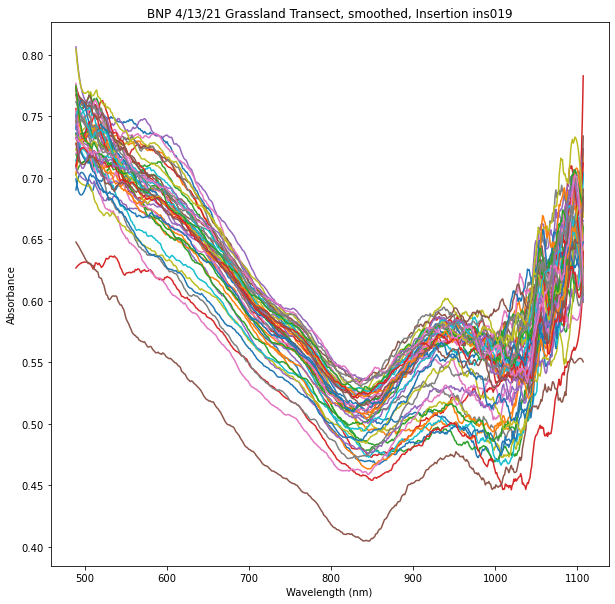

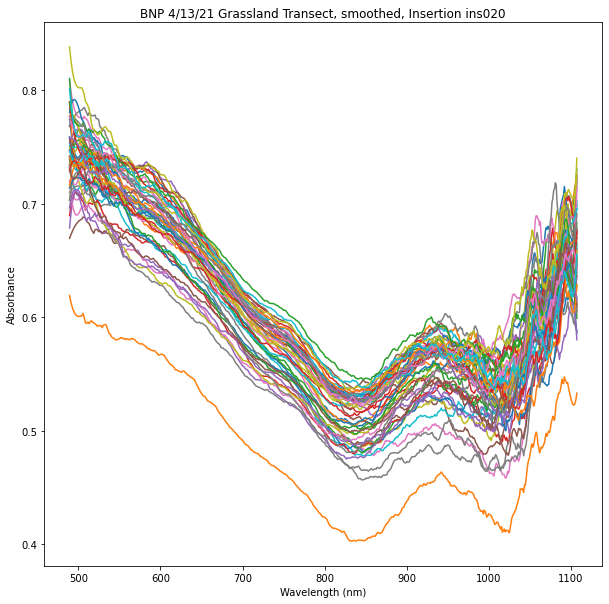

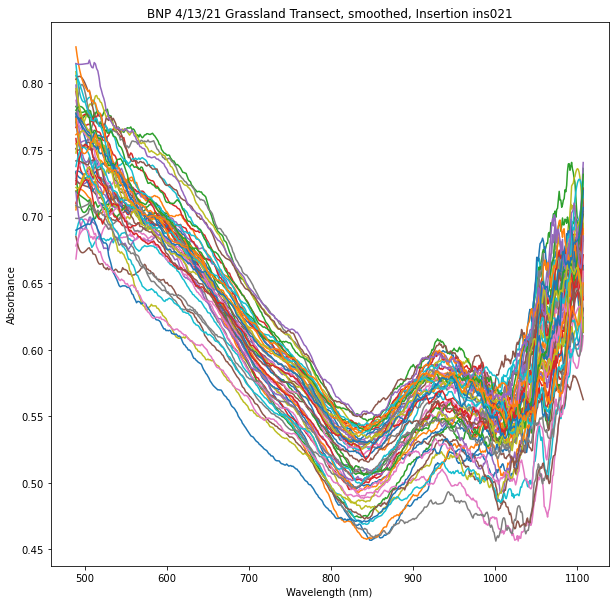

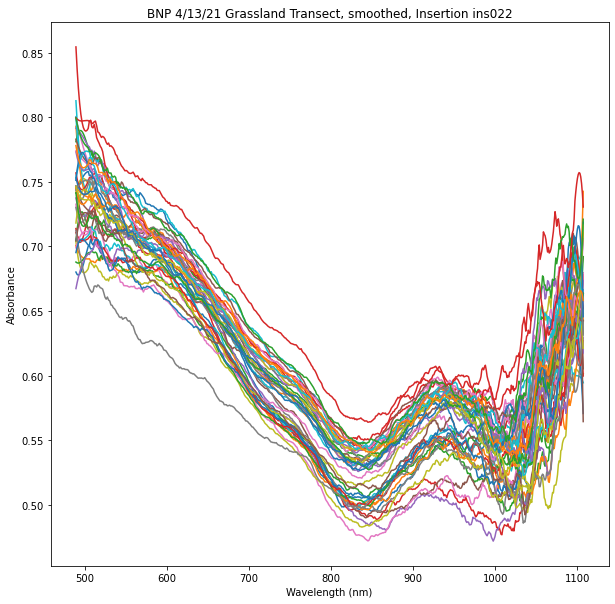

In [62]:
for insert in inserts:
    ins_abs_all = h5_file[f'{ses1}/{insert}/derived/absorbance_depth'][:, :512]
    ins_depths = h5_file[f'{ses1}/{insert}/derived/absorbance_depth'][:, -1]
    ins_abs = ins_abs_all[ins_depths > 6.0]
    fix, ax = plt.subplots(figsize=(10,10))
    ax.set_title(f"BNP 4/13/21 Grassland Transect, smoothed, Insertion {insert}")
    ax.set_ylabel("Absorbance")
    ax.set_xlabel("Wavelength (nm)")
    for i in range (ins_abs.shape[0]):
        ax.plot(vis_waves, savgol_filter(ins_abs[i, :], 21, 3))
    plt.show()
    plt.close()

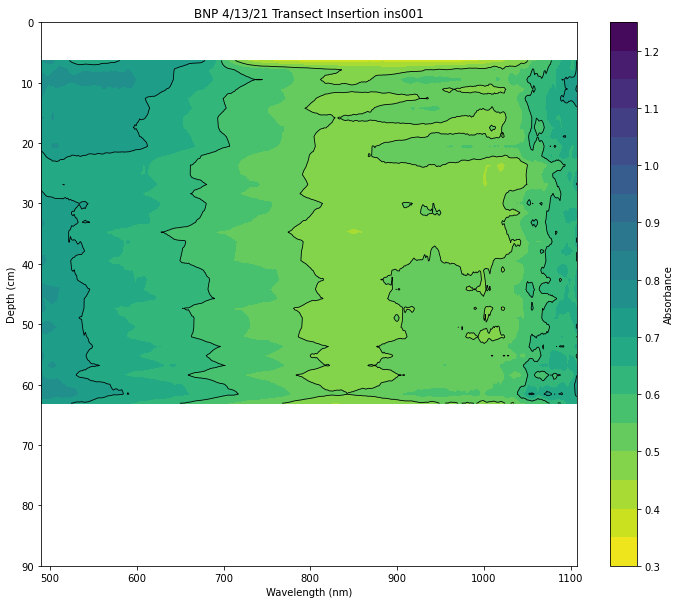

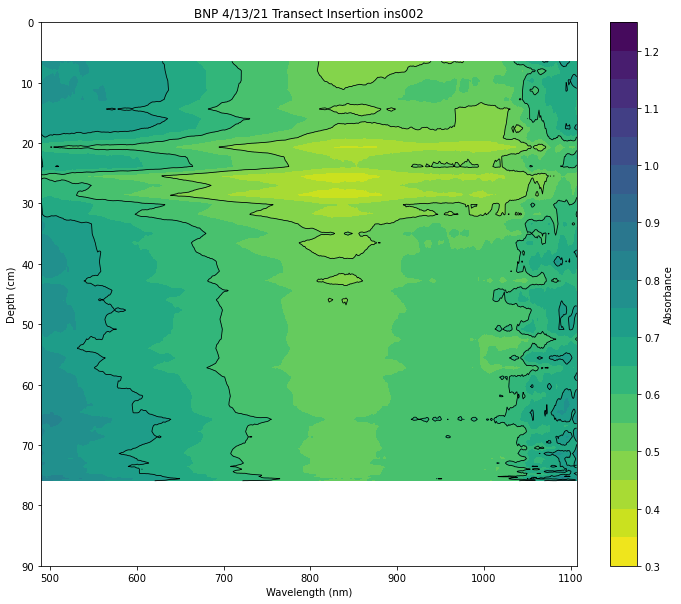

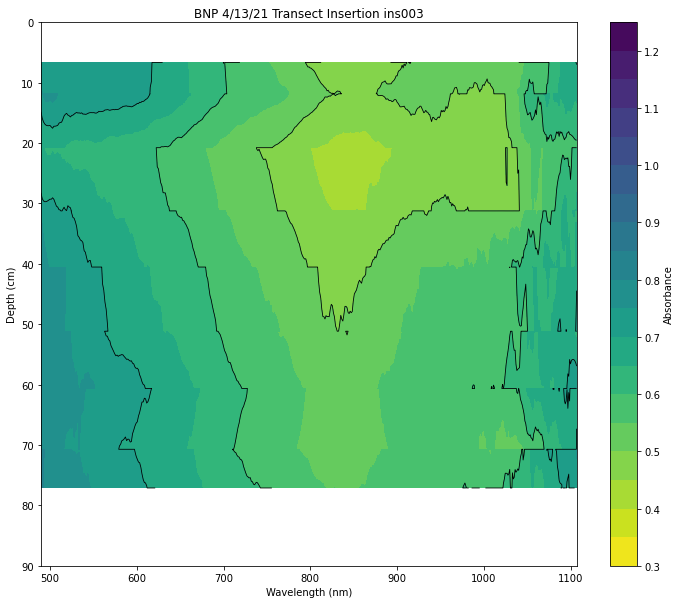

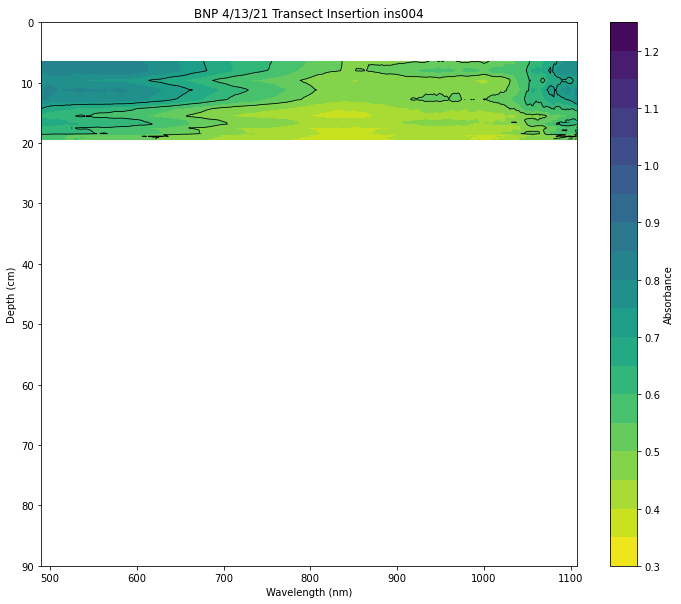

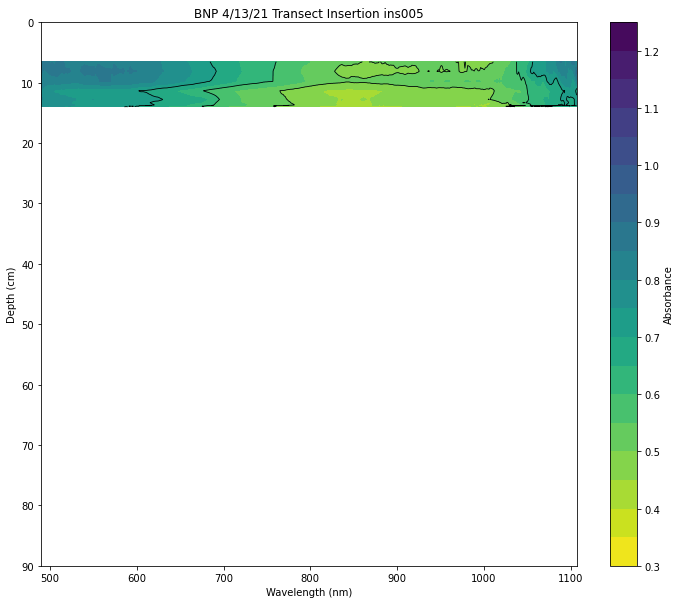

...

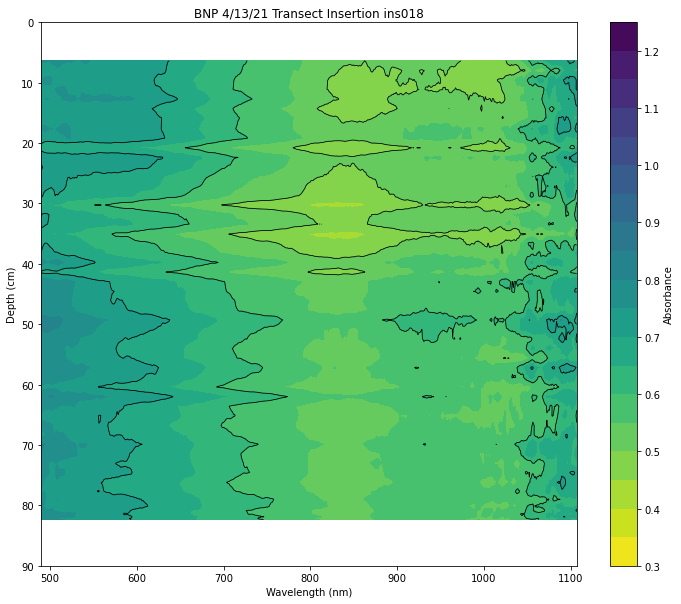

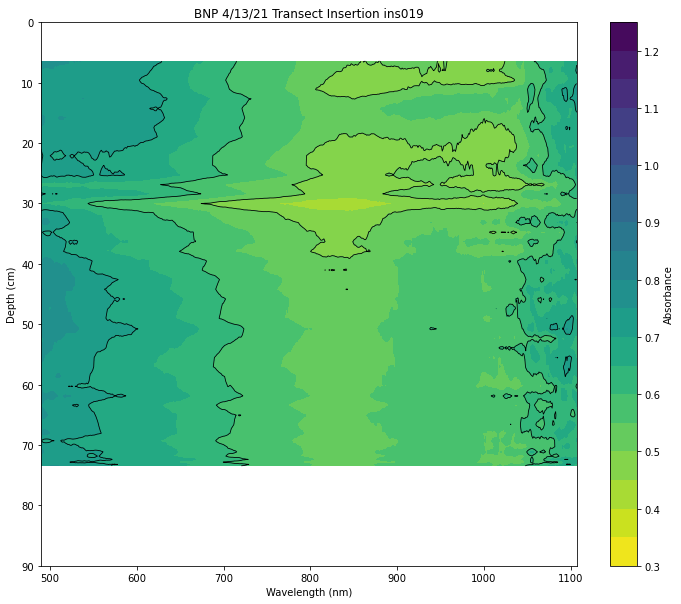

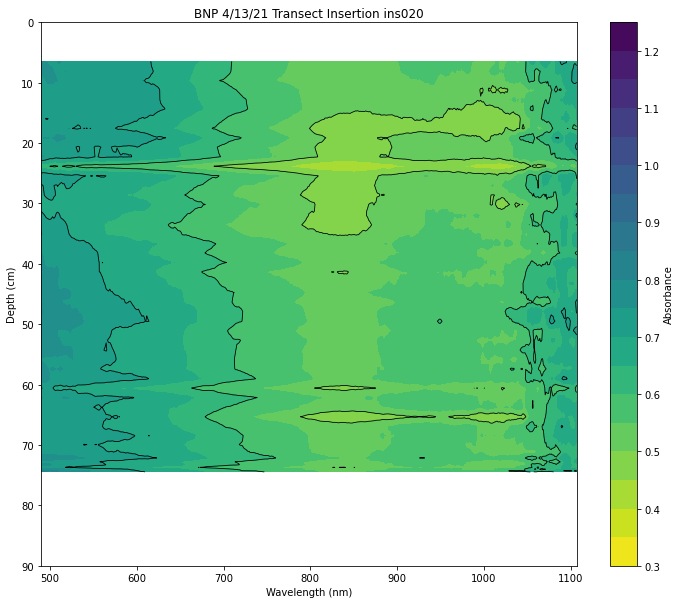

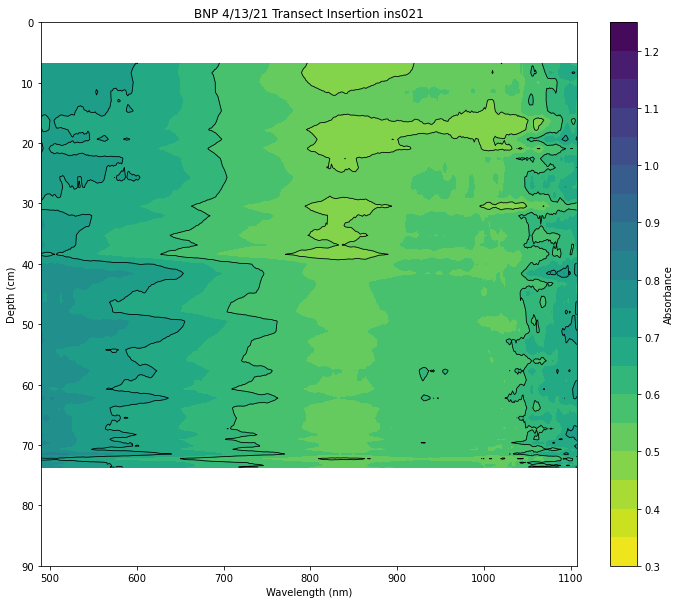

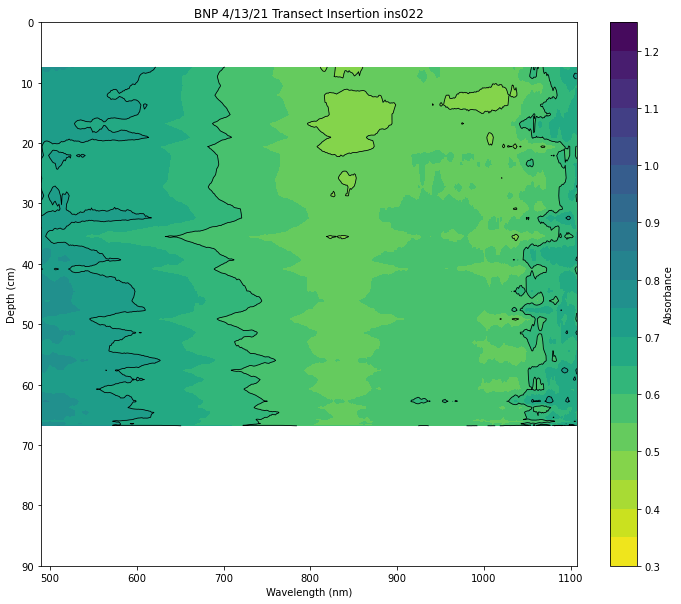

In [21]:
for insert in inserts:
    ins_abs = h5_file[f'{ses1}/{insert}/derived/absorbance_depth'][:, :512]
    ins_depths = h5_file[f'{ses1}/{insert}/derived/absorbance_depth'][:, -1]
    y = ins_depths[ins_depths > 6.0]
    x = vis_waves
    z = savgol_filter(ins_abs[ins_depths > 6.0], 15, 3, axis=1)
    X, Y = np.meshgrid(x, y)

    levels = np.arange(0.3, 1.3, 0.05)
    clevels = [0.50, 0.60, 0.70]
    fig, ax = plt.subplots(figsize = (12,10))

    ax.set_ylim(90, 0)
    ax.set_ylabel("Depth (cm)")
    ax.set_xlabel("Wavelength (nm)")
    ax.set_title(f"BNP 4/13/21 Transect Insertion {insert}")
    cont = ax.contourf(X, Y, z, levels=levels, cmap='viridis_r')
    ax.contour(X, Y, z, levels=clevels, colors='k', linewidths=0.8)

    cbar = fig.colorbar(cont)
    cbar.ax.set_ylabel('Absorbance')
    plt.show()
    
    plt.close(fig)

In [13]:
ins1_abs = h5_file[f'{ses1}/ins001/derived/absorbance_depth'][:, :512]

In [14]:
ins1_depths = h5_file[f'{ses1}/ins001/derived/absorbance_depth'][:, -1]

In [15]:
ins1_depths

array([ 0.07868822,  1.5943058 ,  3.19074783,  4.72790375,  6.33709564,
        7.87486343,  9.49771957, 11.10259399, 12.64244156, 14.24086456,
       15.82455444, 17.4187088 , 18.92970428, 20.53671112, 22.14057007,
       23.65141296, 25.26192474, 26.86725464, 28.40253296, 30.0122345 ,
       31.5535553 , 33.14029236, 34.75121155, 36.33505554, 37.88587646,
       39.48445129, 41.07499695, 42.61098328, 44.22531433, 45.75982666,
       47.3641449 , 48.95097961, 50.48493652, 52.08518677, 53.69158936,
       55.22321167, 56.83259888, 58.41126099, 59.94831543, 61.56259155,
       63.09929199])

In [17]:
ins1_depths[ins1_depths > 6.0]

array([ 6.33709564,  7.87486343,  9.49771957, 11.10259399, 12.64244156,
       14.24086456, 15.82455444, 17.4187088 , 18.92970428, 20.53671112,
       22.14057007, 23.65141296, 25.26192474, 26.86725464, 28.40253296,
       30.0122345 , 31.5535553 , 33.14029236, 34.75121155, 36.33505554,
       37.88587646, 39.48445129, 41.07499695, 42.61098328, 44.22531433,
       45.75982666, 47.3641449 , 48.95097961, 50.48493652, 52.08518677,
       53.69158936, 55.22321167, 56.83259888, 58.41126099, 59.94831543,
       61.56259155, 63.09929199])

In [18]:
ins1_abs[ins1_depths > 6.0]

array([[0.75175811, 0.72250133, 0.75698694, ..., 0.68418761, 0.60880917,
        0.74552501],
       [0.74760017, 0.70633626, 0.7165494 , ..., 0.70347328, 0.66890851,
        0.71564494],
       [0.8430127 , 0.7641093 , 0.77369655, ..., 0.68333101, 0.7295474 ,
        0.76700127],
       ...,
       [0.81894868, 0.78176513, 0.74282711, ..., 0.73797402, 0.73592081,
        0.71844836],
       [0.80173718, 0.77495419, 0.74282711, ..., 0.70168421, 0.65195076,
        0.76282784],
       [0.70207033, 0.7139764 , 0.67061892, ..., 0.75177796, 0.60540025,
        0.62667798]])

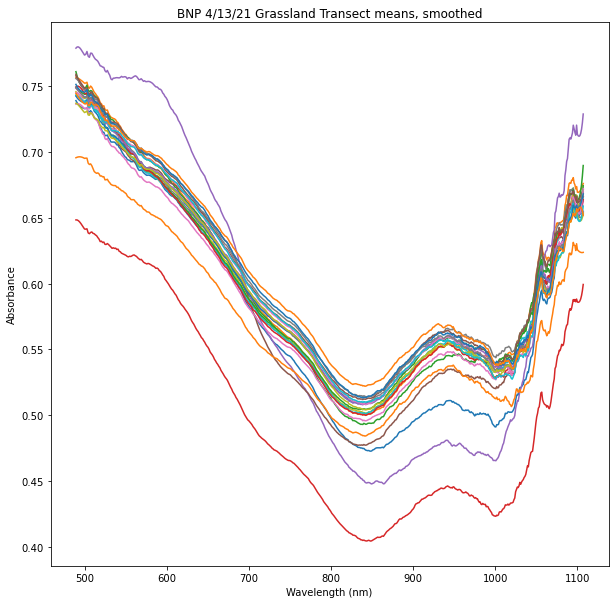

In [27]:
fix, ax = plt.subplots(figsize=(10,10))
ax.set_title(f"BNP 4/13/21 Grassland Transect means, smoothed")
ax.set_ylabel("Absorbance")
ax.set_xlabel("Wavelength (nm)")
for insert in inserts:
    ins_abs_all = h5_file[f'{ses1}/{insert}/derived/absorbance_depth'][:, :512]
    ins_depths = h5_file[f'{ses1}/{insert}/derived/absorbance_depth'][:, -1]
    ins_abs = ins_abs_all[ins_depths > 6.0] 
    ax.plot(vis_waves, savgol_filter(ins_abs.mean(axis=0), 15, 3))
    
plt.show()
plt.close()

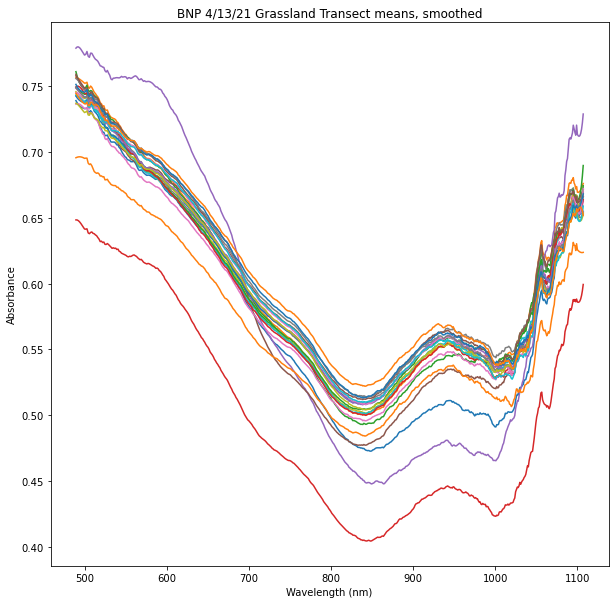

In [61]:
palette = sns.cubehelix_palette(light=.8, n_colors=21)
fix, ax = plt.subplots(figsize=(10,10))
ax.set_title(f"BNP 4/13/21 Grassland Transect means, smoothed")
ax.set_ylabel("Absorbance")
ax.set_xlabel("Wavelength (nm)")
for insert in inserts:
    ins_abs_all = h5_file[f'{ses1}/{insert}/derived/absorbance_depth'][:, :512]
    ins_depths_all = h5_file[f'{ses1}/{insert}/derived/absorbance_depth'][:, -1]
    ins_abs = ins_abs_all[ins_depths_all > 6.0]
    ins_depth = ins_depths_all[ins_depths_all > 6.0]
    # print(ins_abs.shape, ins_depth.shape)
    # print(inserts.index(insert))
    sns.lineplot(x = vis_waves, y = savgol_filter(ins_abs.mean(axis=0), 15, 3))
    
plt.show()
plt.close()

In [63]:
ses2 = ['session002/cal001']
for insert in inserts:
    ins_abs = h5_file[f'{ses2}/{insert}/derived/absorbance_depth'][:, :512]
    ins_depths = h5_file[f'{ses2}/{insert}/derived/absorbance_depth'][:, -1]
    y = ins_depths[ins_depths > 6.0]
    x = vis_waves
    z = savgol_filter(ins_abs[ins_depths > 6.0], 15, 3, axis=1)
    X, Y = np.meshgrid(x, y)

    levels = np.arange(0.3, 1.3, 0.05)
    clevels = [0.50, 0.60, 0.70]
    fig, ax = plt.subplots(figsize = (12,10))

    ax.set_ylim(90, 0)
    ax.set_ylabel("Depth (cm)")
    ax.set_xlabel("Wavelength (nm)")
    ax.set_title(f"BNP 4/13/21 Transect Insertion {insert}")
    cont = ax.contourf(X, Y, z, levels=levels, cmap='viridis_r')
    ax.contour(X, Y, z, levels=clevels, colors='k', linewidths=0.8)

    cbar = fig.colorbar(cont)
    cbar.ax.set_ylabel('Absorbance')
    plt.show()
    
    plt.close(fig)

KeyError: 'Unable to open object (component not found)'

In [65]:
inserts = list(h5_file['session002/cal001'].keys())

In [66]:
inserts

['ins001', 'ins002', 'ins003', 'ins004', 'ins005', 'ins006']

In [67]:
ses2 = 'session002/cal001'

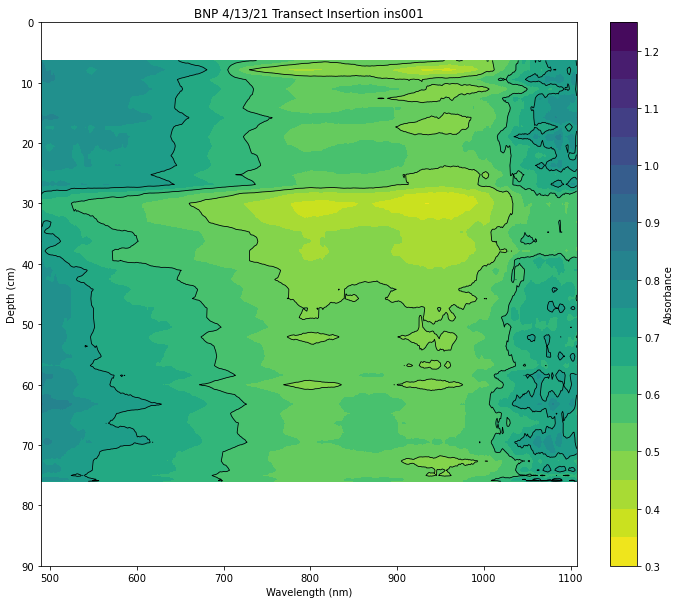

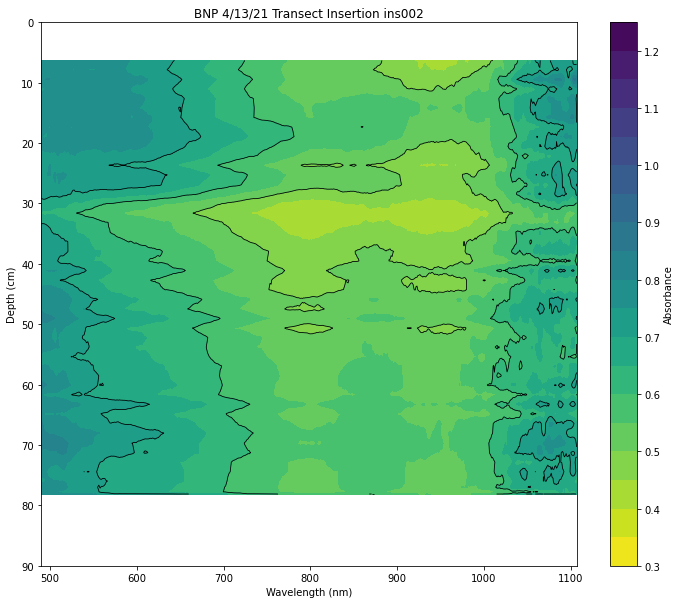

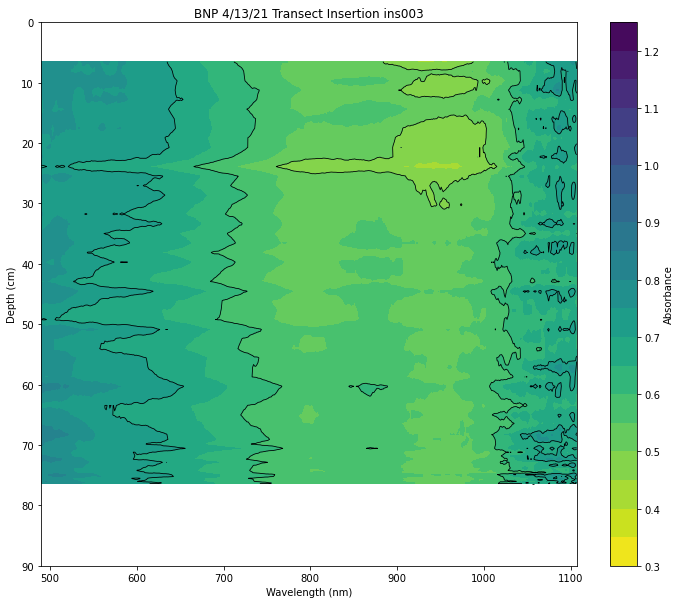

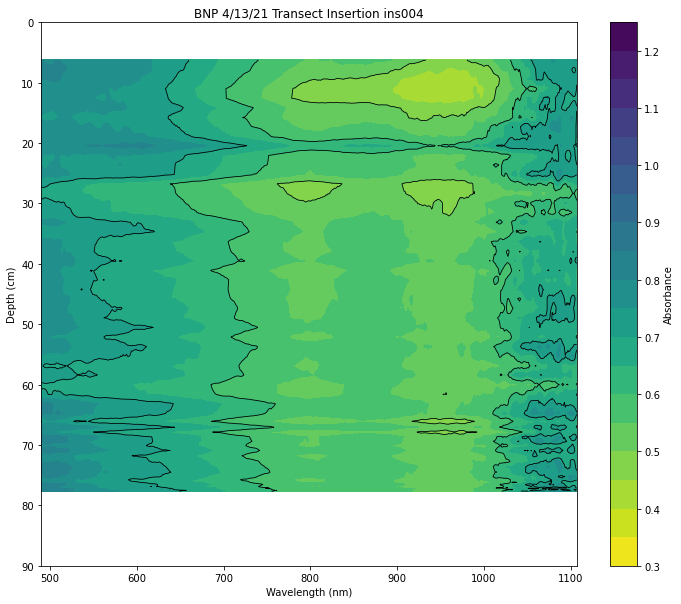

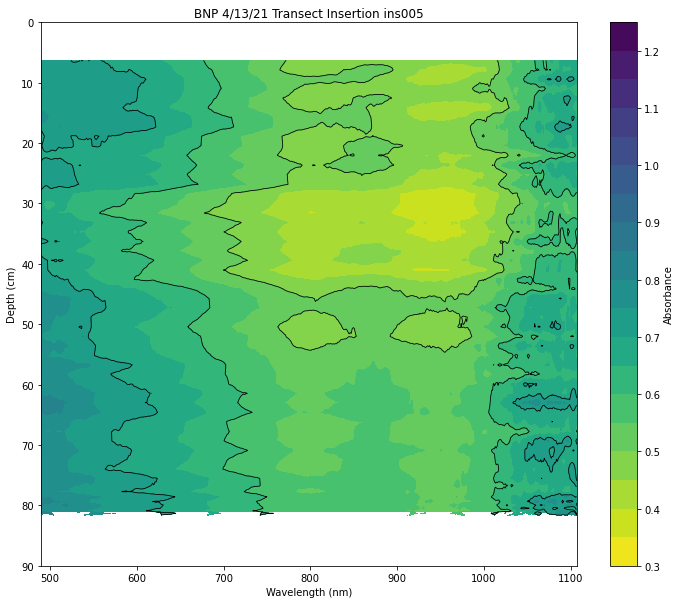

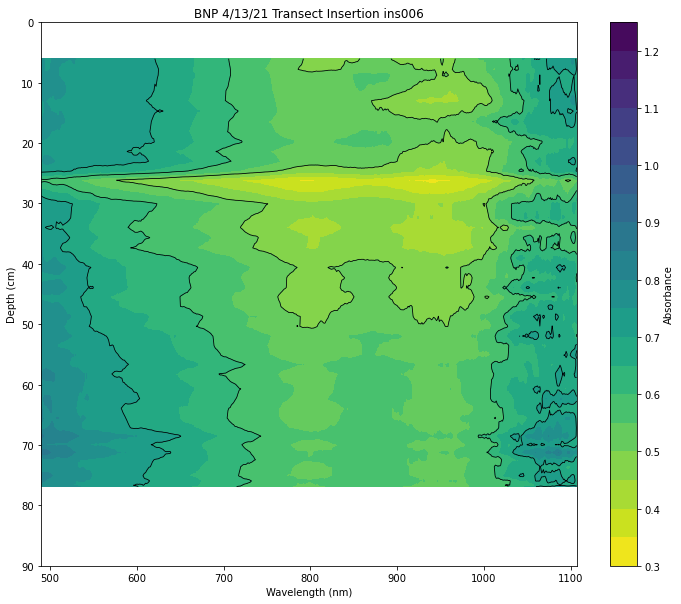

In [68]:
for insert in inserts:
    ins_abs = h5_file[f'{ses2}/{insert}/derived/absorbance_depth'][:, :512]
    ins_depths = h5_file[f'{ses2}/{insert}/derived/absorbance_depth'][:, -1]
    y = ins_depths[ins_depths > 6.0]
    x = vis_waves
    z = savgol_filter(ins_abs[ins_depths > 6.0], 15, 3, axis=1)
    X, Y = np.meshgrid(x, y)

    levels = np.arange(0.3, 1.3, 0.05)
    clevels = [0.50, 0.60, 0.70]
    fig, ax = plt.subplots(figsize = (12,10))

    ax.set_ylim(90, 0)
    ax.set_ylabel("Depth (cm)")
    ax.set_xlabel("Wavelength (nm)")
    ax.set_title(f"BNP 4/13/21 Transect Insertion {insert}")
    cont = ax.contourf(X, Y, z, levels=levels, cmap='viridis_r')
    ax.contour(X, Y, z, levels=clevels, colors='k', linewidths=0.8)

    cbar = fig.colorbar(cont)
    cbar.ax.set_ylabel('Absorbance')
    plt.show()
    
    plt.close(fig)

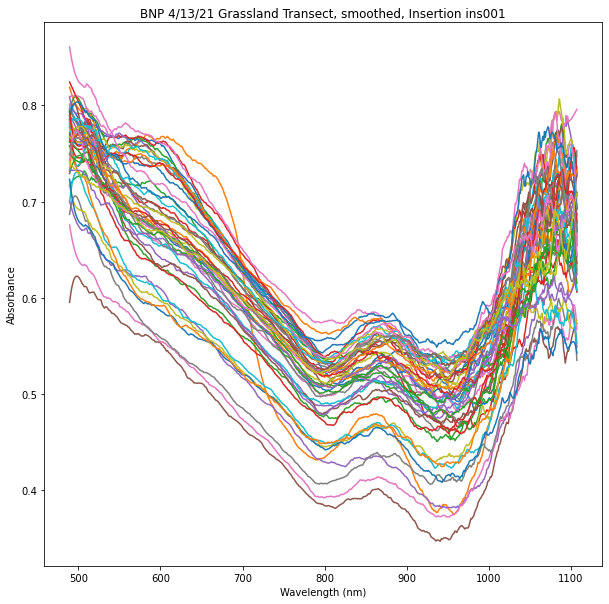

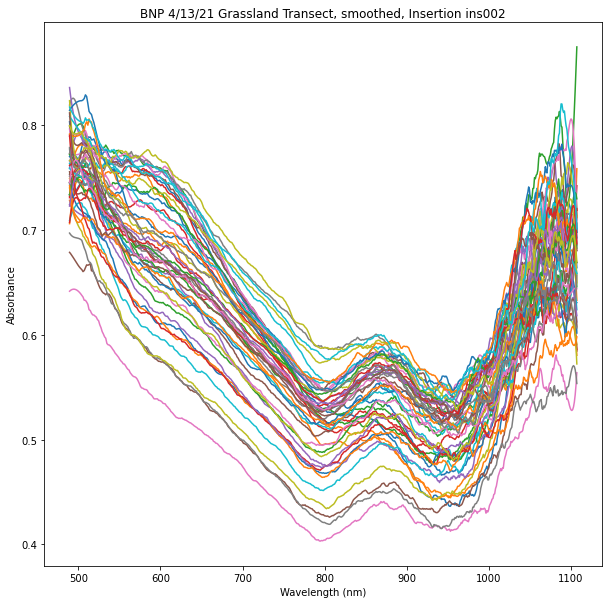

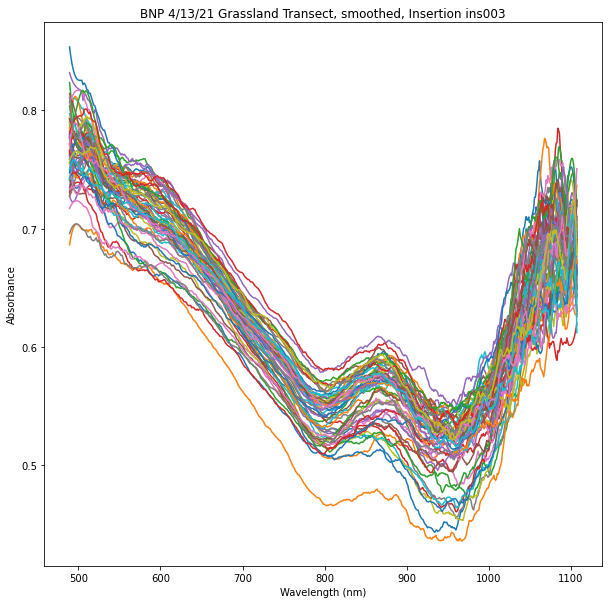

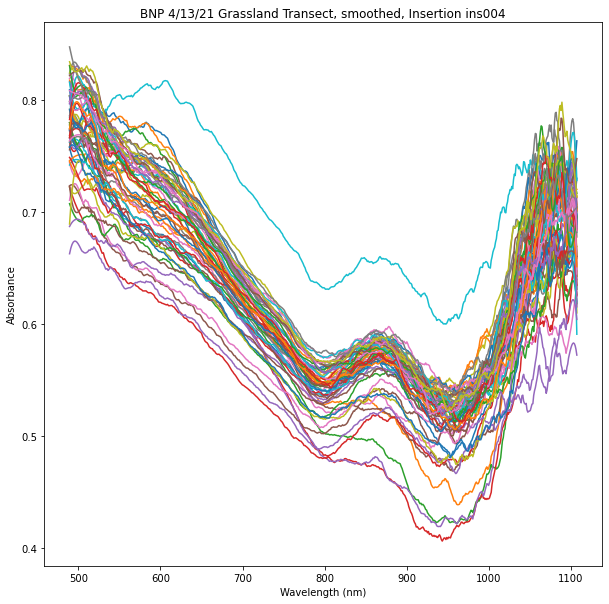

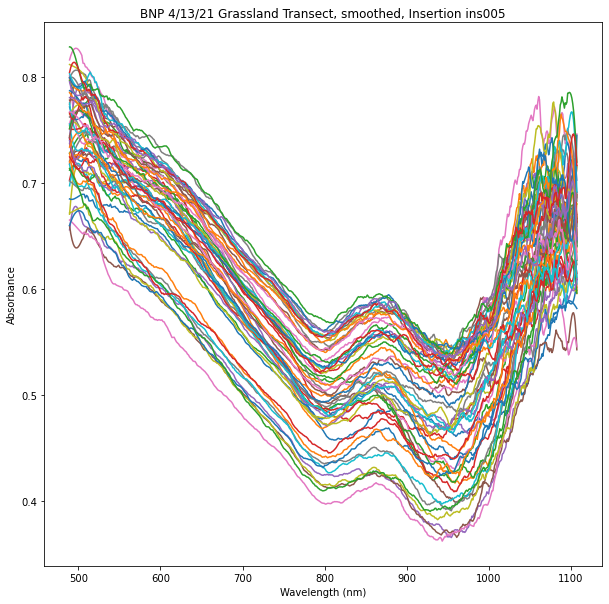

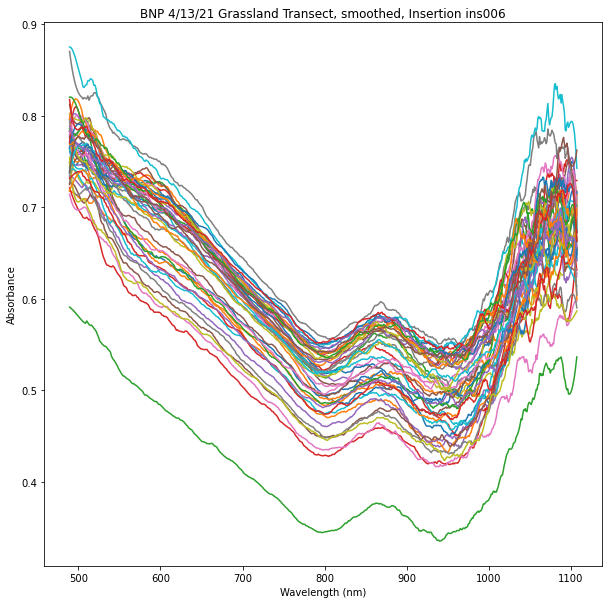

In [69]:
for insert in inserts:
    ins_abs_all = h5_file[f'{ses2}/{insert}/derived/absorbance_depth'][:, :512]
    ins_depths = h5_file[f'{ses2}/{insert}/derived/absorbance_depth'][:, -1]
    ins_abs = ins_abs_all[ins_depths > 6.0]
    fix, ax = plt.subplots(figsize=(10,10))
    ax.set_title(f"BNP 4/13/21 Grassland Transect, smoothed, Insertion {insert}")
    ax.set_ylabel("Absorbance")
    ax.set_xlabel("Wavelength (nm)")
    for i in range (ins_abs.shape[0]):
        ax.plot(vis_waves, savgol_filter(ins_abs[i, :], 21, 3))
    plt.show()
    plt.close()

In [70]:
list(h5_file['session002/cal001'].attrs.keys())

['calibration_start_time',
 'dark_spectrum',
 'dark_spectrum2',
 'ftir_amplitude',
 'ftir_calibration_cycles',
 'ftir_calibration_gain',
 'ftir_calibration_measure_mode',
 'ftir_cycles',
 'ftir_direction',
 'ftir_frequency',
 'ftir_gain',
 'ftir_integrate_mode',
 'ftir_measure_mode',
 'ftir_temperature',
 'ftir_wavenums_count',
 'ftir_zero_fill',
 'spec1_wavelengths_vector',
 'spec2_wavelengths_vector',
 'vis_capture_mode',
 'vis_cycle_time',
 'vis_data_count',
 'vis_data_transmit',
 'vis_exposure_seconds',
 'vis_exposure_time',
 'vis_gain_mode',
 'vis_sensor_gain_mode',
 'white_spectrum',
 'white_spectrum2']

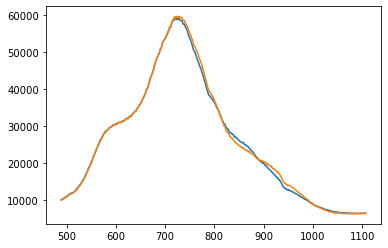

In [72]:
plt.plot(vis_waves, h5_file['session002/cal001'].attrs['white_spectrum'])
plt.plot(vis_waves, h5_file['session001/cal001'].attrs['white_spectrum'])